<a href="https://colab.research.google.com/github/azzindani/00_Kaggle_Biomed_Dataset/blob/main/00_Liver_Segmentation_v3.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Neuroimaging Informatics Technology Initiative (NIfTI) Viewer

## 00 Import Modules

In [1]:
!command -v ffmpeg >/dev/null || (apt update && apt install -y ffmpeg)
!pip install -q mediapy

import os
import nibabel as nib
import matplotlib.pyplot as plt
import numpy as np
import cv2
import mediapy as media

from zipfile import ZipFile

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 12.2 MB/s eta 0:00:00


## 01 Download Dataset

In [2]:
url = 'https://www.kaggle.com/datasets/fattahuzzaman/ircadresearch-institute-against-digestive-cancer'
url_path = url.split('datasets/')[1]

!kaggle datasets download -d {url_path}

Dataset URL: https://www.kaggle.com/datasets/fattahuzzaman/ircadresearch-institute-against-digestive-cancer
License(s): Community Data License Agreement - Sharing - Version 1.0
 99% 672M/676M [00:09<00:00, 47.6MB/s]
100% 676M/676M [00:09<00:00, 73.6MB/s]


## 02 Extract Dataset

In [3]:
zipfile = ZipFile(os.listdir()[1])
zipfile.extractall() #'''

## 03 Get File List

In [4]:
root_dir = '/content/'
file_format = '.nii'
n = 5
file_paths = []

for root, dirs, files in os.walk(root_dir):
  for file in files:
    if file.endswith(file_format):
      file_paths.append(os.path.join(root, file))

    if len(file_paths) >= n:
      break
  if len(file_paths) >= n:
    break

file_paths

['/content/ircad-dataset/ircad_e01_liver.nii',
 '/content/ircad-dataset/ircad_e19_orig.nii',
 '/content/ircad-dataset/ircad_e17_liver.nii',
 '/content/ircad-dataset/ircad_e01_orig.nii',
 '/content/ircad-dataset/ircad_e13_liver.nii']

In [5]:
mask_path = file_paths[0]
mask_path

'/content/ircad-dataset/ircad_e01_liver.nii'

In [6]:
ori_path = file_paths[3]
ori_path

'/content/ircad-dataset/ircad_e01_orig.nii'

## 04 Define Preview Function

In [7]:
def preview_nifti(ori_path, mask_path, compress = 2):
  ori_img = nib.load(ori_path)
  mask_img = nib.load(mask_path)

  ori_data = ori_img.get_fdata()
  mask_data = mask_img.get_fdata()

  ori_data = (ori_data - np.min(ori_data)) / (np.max(ori_data) - np.min(ori_data))

  height, width = ori_data.shape[:2]
  fps = 10
  output_video_path = ori_path.split('/')[-1].split('.')[0] + '.mp4'
  ori_opacity = 1
  mask_opacity = 0.5

  fourcc = cv2.VideoWriter_fourcc(*'XVID')
  video_writer = cv2.VideoWriter(output_video_path, fourcc, fps, (width, height))

  for i in range(ori_data.shape[2]):
    ori_slice = (ori_data[:, :, i] * 255).astype(np.uint8)
    mask_slice = (mask_data[:, :, i] > 0).astype(np.uint8)

    color_mask = np.zeros((height, width, 3), dtype = np.uint8)
    color_mask[mask_slice == 1] = [255, 0, 0]

    ori_colored = cv2.cvtColor(ori_slice, cv2.COLOR_GRAY2BGR)
    combined_frame = cv2.addWeighted(ori_colored, ori_opacity, color_mask, mask_opacity, 0)
    video_writer.write(combined_frame)

  video_writer.release()

  video = media.read_video(output_video_path)
  print('This is volume path :', ori_path)
  print('This is mask path :', mask_path)
  print(f'Shape is (num_images, height, width, num_channels) = {video.shape}.')
  if metadata := video.metadata:
    print(f'Framerate is {metadata.fps} frames/s.')
  video2 = media.resize_video(video, tuple(np.array(video.shape[1:3]) // compress))
  return media.show_video(video2, fps = fps, codec = 'gif')

## 05 Preview NIfTI

This is volume path : /content/ircad-dataset/ircad_e01_orig.nii
This is mask path : /content/ircad-dataset/ircad_e01_liver.nii
Shape is (num_images, height, width, num_channels) = (129, 512, 512, 3).
Framerate is 10.0 frames/s.


""

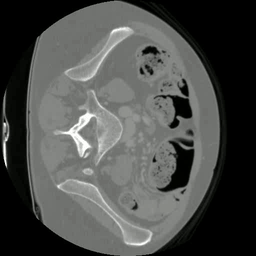

In [8]:
mask_path = file_paths[0]
ori_path = file_paths[3]
preview_nifti(ori_path, mask_path, compress = 2)

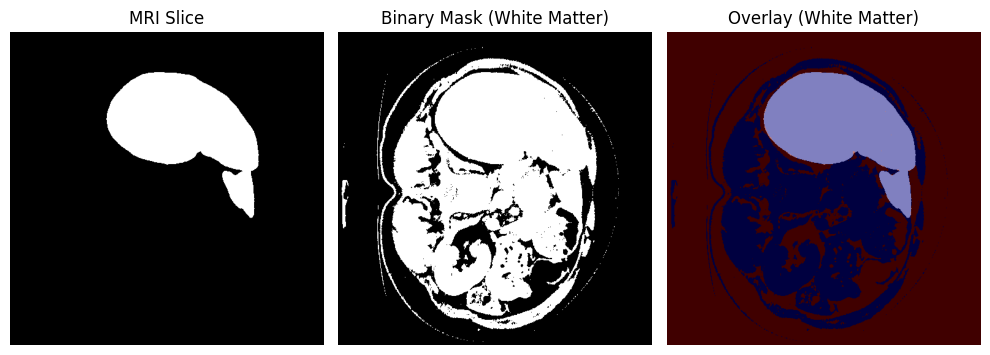

In [9]:
mri_path = file_paths[0]
mask_path = file_paths[3]

mri_img = nib.load(mri_path)
mask_img = nib.load(mask_path)

mri_data = mri_img.get_fdata()
mask_data = mask_img.get_fdata()

# Threshold the mask for white matter detection
threshold = 0.5  # Adjust as needed
binary_mask = (mask_data > threshold).astype(np.uint8)

# Select a slice to visualize
slice_idx = mri_data.shape[2] // 2  # Middle slice
mri_slice = mri_data[:, :, slice_idx]
mask_slice = binary_mask[:, :, slice_idx]

# Normalize MRI slice
mri_slice_norm = cv2.normalize(mri_slice, None, 0, 255, cv2.NORM_MINMAX).astype(np.uint8)

# Overlay the white matter mask
mri_colored = cv2.cvtColor(mri_slice_norm, cv2.COLOR_GRAY2BGR)
mask_colored = cv2.applyColorMap(mask_slice * 255, cv2.COLORMAP_JET)  # Colorize the mask

alpha = 0.5
overlay = cv2.addWeighted(mri_colored, 1 - alpha, mask_colored, alpha, 0)

# Display the result
plt.figure(figsize=(10, 5))
plt.subplot(1, 3, 1)
plt.imshow(mri_slice_norm, cmap='gray')
plt.title('MRI Slice')
plt.axis('off')

plt.subplot(1, 3, 2)
plt.imshow(mask_slice, cmap='gray')
plt.title('Binary Mask (White Matter)')
plt.axis('off')

plt.subplot(1, 3, 3)
plt.imshow(overlay)
plt.title('Overlay (White Matter)')
plt.axis('off')

plt.tight_layout()
plt.show()

In [10]:
mri_img = nib.load(mri_path)
mask_img = nib.load(mask_path)

mri_data = mri_img.get_fdata()
mask_data = mask_img.get_fdata()

# Threshold the mask for white matter detection
threshold = 0.5  # Adjust as needed
binary_mask = (mask_data > threshold).astype(np.uint8)

# Normalize MRI data for visualization
mri_data_norm = (255 * (mri_data - np.min(mri_data)) / (np.max(mri_data) - np.min(mri_data))).astype(np.uint8)

# Set up video writer
output_path = "mri_mask_overlay.mp4"
fps = 10  # Frames per second
frame_size = (mri_data.shape[0], mri_data.shape[1])  # Width, Height based on slice dimensions
fourcc = cv2.VideoWriter_fourcc(*'mp4v')  # Codec for MP4
video_writer = cv2.VideoWriter(output_path, fourcc, fps, (frame_size[1], frame_size[0]))

# Create video frames for each slice
for slice_idx in range(mri_data.shape[2]):  # Iterate through all slices
    mri_slice = mri_data_norm[:, :, slice_idx]
    mask_slice = binary_mask[:, :, slice_idx]

    # Convert MRI slice to a 3-channel grayscale image
    mri_colored = cv2.cvtColor(mri_slice, cv2.COLOR_GRAY2BGR)

    # Create a color map for the mask
    mask_colored = cv2.applyColorMap((mask_slice * 255).astype(np.uint8), cv2.COLORMAP_JET)

    # Overlay the mask on the MRI slice
    alpha = 0.5  # Transparency level
    overlay = cv2.addWeighted(mri_colored, 1 - alpha, mask_colored, alpha, 0)

    # Write the frame to the video
    video_writer.write(overlay)

# Release the video writer
video_writer.release()

This is volume path : /content/ircad-dataset/ircad_e01_orig.nii
This is mask path : /content/ircad-dataset/ircad_e01_orig.nii
Shape is (num_images, height, width, num_channels) = (129, 512, 512, 3).
Framerate is 10.0 frames/s.


""

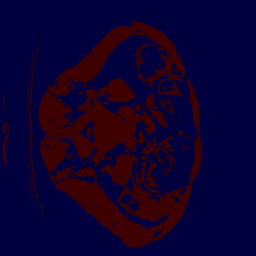

In [11]:
video = media.read_video(output_path)
print('This is volume path :', ori_path)
print('This is mask path :', mask_path)
print(f'Shape is (num_images, height, width, num_channels) = {video.shape}.')
if metadata := video.metadata:
  print(f'Framerate is {metadata.fps} frames/s.')
video2 = media.resize_video(video, tuple(np.array(video.shape[1:3]) // 2))
media.show_video(video2, fps = fps, codec = 'gif')

In [12]:
!pip install -q nilearn

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 10.5/10.5 MB 42.5 MB/s eta 0:00:00


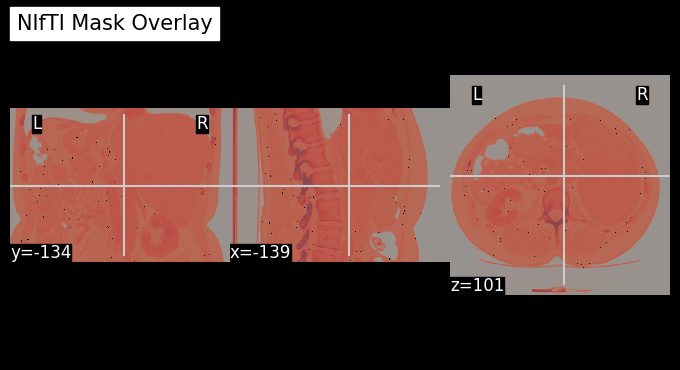

In [13]:
from nilearn.plotting import plot_roi

plot_roi(mask_path, bg_img=ori_path, cmap="Reds", alpha=0.6, title="NIfTI Mask Overlay")
plt.show()

In [14]:
!pip install -q scikit-image

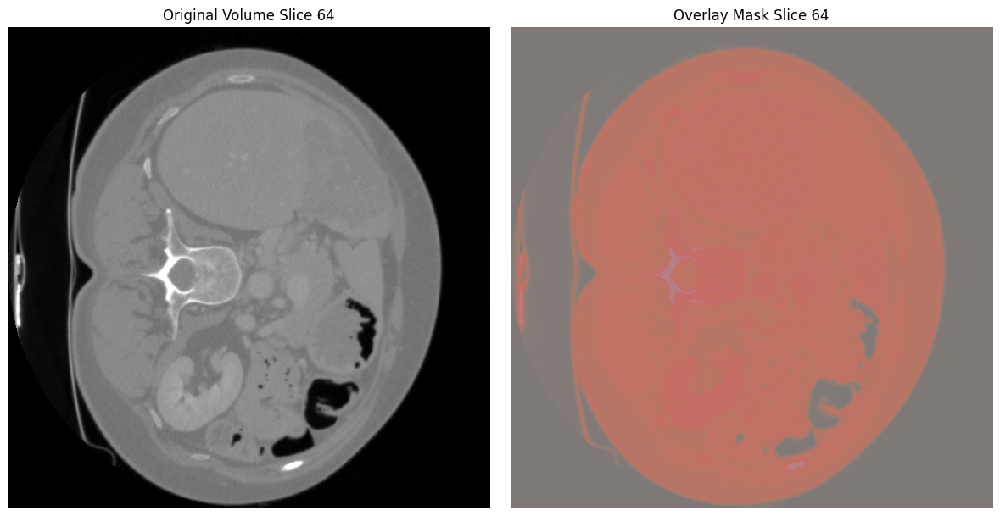

In [15]:
import plotly.graph_objects as go
from skimage import measure

volume = nib.load(ori_path)
mask = nib.load(mask_path)

# Get the data as NumPy arrays
volume_data = volume.get_fdata()
mask_data = mask.get_fdata()

# Function to explore a slice in 2D
def preview_2d(volume_data, mask_data, slice_index=50):
    plt.figure(figsize=(12, 6))

    # Original Volume Slice
    plt.subplot(1, 2, 1)
    plt.imshow(volume_data[:, :, slice_index], cmap='gray')
    plt.title(f"Original Volume Slice {slice_index}")
    plt.axis('off')

    # Overlay Mask Slice
    plt.subplot(1, 2, 2)
    plt.imshow(volume_data[:, :, slice_index], cmap='gray')
    plt.imshow(mask_data[:, :, slice_index], cmap='Reds', alpha=0.5)
    plt.title(f"Overlay Mask Slice {slice_index}")
    plt.axis('off')

    plt.tight_layout()
    plt.show()

# Function to render 3D visualization
def render_3d(volume_data, mask_data, threshold=0.5):
    fig = go.Figure()

    # Render Volume (Semi-Transparent)
    verts, faces, _, _ = measure.marching_cubes(volume_data, level=np.mean(volume_data))
    fig.add_trace(go.Mesh3d(
        x=verts[:, 0], y=verts[:, 1], z=verts[:, 2],
        i=faces[:, 0], j=faces[:, 1], k=faces[:, 2],
        color='lightblue', opacity=0.2, name="Volume"
    ))

    # Render Mask
    verts, faces, _, _ = measure.marching_cubes(mask_data, level=threshold)
    fig.add_trace(go.Mesh3d(
        x=verts[:, 0], y=verts[:, 1], z=verts[:, 2],
        i=faces[:, 0], j=faces[:, 1], k=faces[:, 2],
        color='red', opacity=0.5, name="Mask"
    ))

    # Layout Adjustments
    fig.update_layout(
        scene=dict(
            xaxis_title="X-axis",
            yaxis_title="Y-axis",
            zaxis_title="Z-axis",
        ),
        title="3D Rendering of Volume and Mask",
    )
    fig.show()

# Preview a 2D slice
slice_index = volume_data.shape[2] // 2  # Middle slice
preview_2d(volume_data, mask_data, slice_index)

In [16]:

# Load the volume and mask
img = nib.load(ori_path)
mask_img = nib.load(mask_path)

# Extract voxel data
voxel_data = img.get_fdata()
mask_data = mask_img.get_fdata()

# Check dimensions
print(f"Volume shape: {voxel_data.shape}")
print(f"Mask shape: {mask_data.shape}")

Volume shape: (512, 512, 129)
Mask shape: (512, 512, 129)


In [17]:
# Apply the mask to the volume
masked_data = voxel_data * mask_data

# Normalize the masked data for visualization (optional)
masked_data = (masked_data - np.min(masked_data)) / (np.max(masked_data) - np.min(masked_data))

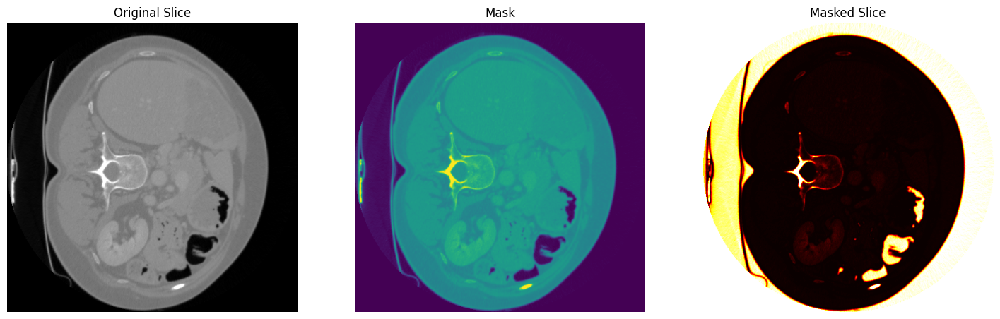

In [18]:

# Select an axial slice for visualization
slice_idx = voxel_data.shape[2] // 2
original_slice = voxel_data[:, :, slice_idx]
mask_slice = mask_data[:, :, slice_idx]
masked_slice = masked_data[:, :, slice_idx]

# Plot the slices
fig, axes = plt.subplots(1, 3, figsize=(18, 6))

axes[0].imshow(original_slice, cmap='gray')
axes[0].set_title('Original Slice')
axes[0].axis('off')

axes[1].imshow(mask_slice, cmap='viridis')
axes[1].set_title('Mask')
axes[1].axis('off')

axes[2].imshow(masked_slice, cmap='hot')
axes[2].set_title('Masked Slice')
axes[2].axis('off')

plt.show()

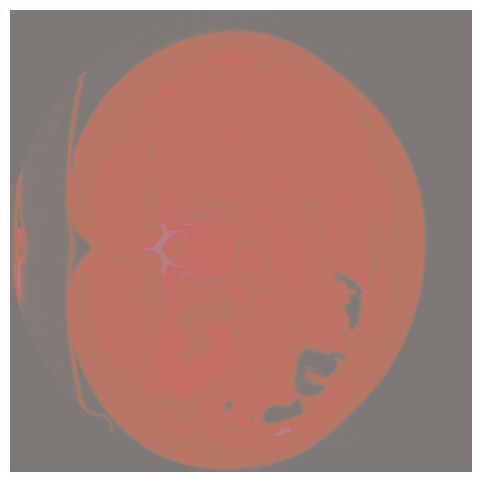

In [19]:
def overlay_mask(slice_data, mask_slice, alpha=0.5, cmap_mask='Reds'):
    """Overlay a mask on a slice."""
    plt.figure(figsize=(6, 6))
    plt.imshow(slice_data, cmap='gray', alpha=1)
    plt.imshow(mask_slice, cmap=cmap_mask, alpha=alpha)
    plt.axis('off')
    plt.show()

# Overlay mask on an axial slice
overlay_mask(original_slice, mask_slice, alpha=0.5)

Visualizing slices...


/usr/local/lib/python3.10/dist-packages/nilearn/plotting/find_cuts.py:148: UserWarning: Could not determine cut coords: All voxels were masked by the thresholding. Returning the center of mass instead.
  warnings.warn(


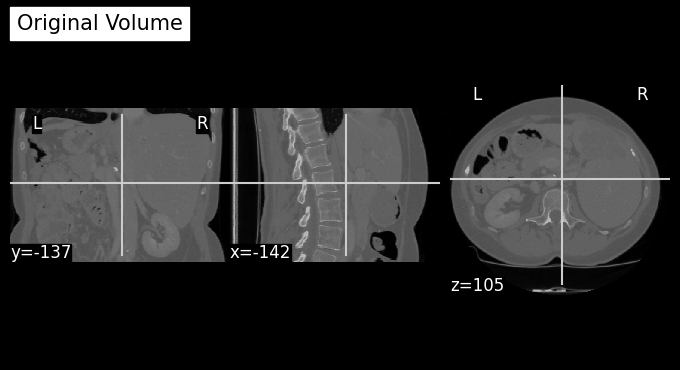

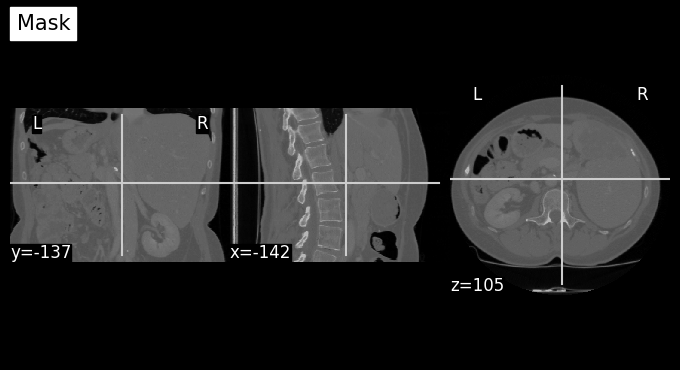

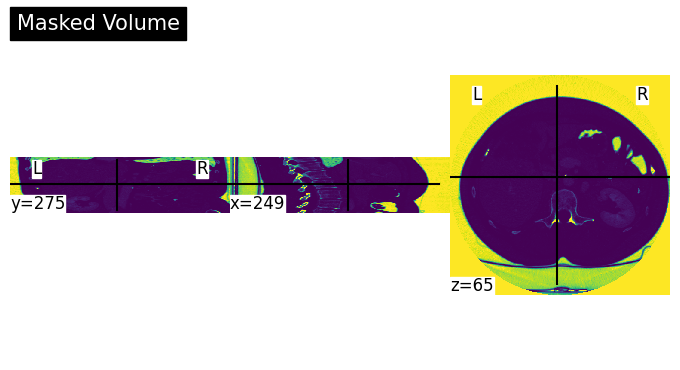

In [21]:

import nibabel as nib
import numpy as np
from nilearn import plotting
import plotly.graph_objects as go

# Load the volume and mask files
def load_nifti(file_path):
    nii_img = nib.load(file_path)
    nii_data = nii_img.get_fdata()
    spacing = nii_img.header.get_zooms()  # Voxel spacing
    return nii_data, spacing

# Apply the mask to the volume
def apply_mask(volume, mask):
    return np.multiply(volume, mask)  # Element-wise multiplication

# Create a 3D plot
def create_3d_plot(volume, spacing, threshold=0.5):
    x, y, z = np.where(volume > threshold)  # Get coordinates of non-zero voxels
    values = volume[x, y, z]  # Intensities of those voxels

    fig = go.Figure(data=go.Scatter3d(
        x=x * spacing[0],  # Scale with spacing
        y=y * spacing[1],
        z=z * spacing[2],
        mode='markers',
        marker=dict(
            size=2,  # Marker size
            color=values,  # Map intensity values to colors
            colorscale='Viridis',  # Color map
            opacity=0.5
        )
    ))

    fig.update_layout(
        title="3D Visualization of MRI/CT Data",
        scene=dict(
            xaxis_title="X-axis",
            yaxis_title="Y-axis",
            zaxis_title="Z-axis",
        )
    )
    return fig

# Load the volume and mask
volume_data, spacing = load_nifti(ori_path)
mask_data, _ = load_nifti(mask_path)

# Apply the mask to the volume
masked_volume = apply_mask(volume_data, mask_data)

# Step 1: Visualize slices using Nilearn
print("Visualizing slices...")
plotting.plot_anat(ori_path, title="Original Volume")
plotting.plot_anat(mask_path, title="Mask")
plotting.plot_img(nib.Nifti1Image(masked_volume, affine=np.eye(4)), title="Masked Volume")
plotting.show()

In [22]:

# Step 2: Create and display a 3D plot
print("Creating 3D plot...")
fig = create_3d_plot(masked_volume, spacing, threshold=0.2)  # Adjust threshold if needed
fig.show()

Creating 3D plot...


KeyboardInterrupt: 

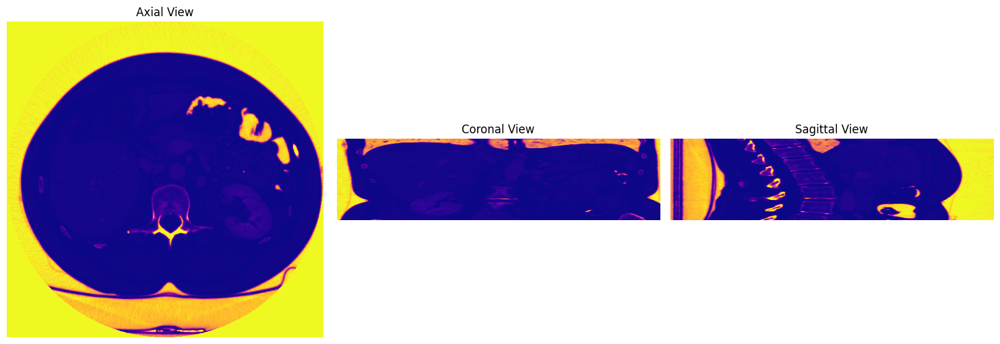

In [23]:


# Load the volume data
def load_nifti(file_path):
    nii_img = nib.load(file_path)
    nii_data = nii_img.get_fdata()
    return nii_data

# Plot 2D slices with coloring
def plot_slices(volume, mask=None, colormap="viridis", slice_indices=None):
    """
    Plots 2D slices of the volume from axial, coronal, and sagittal views.

    Parameters:
    - volume: 3D numpy array of volume data.
    - mask: 3D numpy array of the mask (optional, same shape as volume).
    - colormap: Matplotlib colormap for visualization.
    - slice_indices: Dictionary specifying slice indices for each view.
    """
    if slice_indices is None:
        slice_indices = {
            "axial": volume.shape[2] // 2,  # Middle slice along axial axis
            "coronal": volume.shape[1] // 2,  # Middle slice along coronal axis
            "sagittal": volume.shape[0] // 2,  # Middle slice along sagittal axis
        }

    fig, axes = plt.subplots(1, 3, figsize=(15, 5))

    # Axial view
    axial_slice = volume[:, :, slice_indices["axial"]]
    if mask is not None:
        axial_slice = np.multiply(axial_slice, mask[:, :, slice_indices["axial"]])
    axes[0].imshow(axial_slice.T, cmap=colormap, origin="lower")
    axes[0].set_title("Axial View")
    axes[0].axis("off")

    # Coronal view
    coronal_slice = volume[:, slice_indices["coronal"], :]
    if mask is not None:
        coronal_slice = np.multiply(coronal_slice, mask[:, slice_indices["coronal"], :])
    axes[1].imshow(coronal_slice.T, cmap=colormap, origin="lower")
    axes[1].set_title("Coronal View")
    axes[1].axis("off")

    # Sagittal view
    sagittal_slice = volume[slice_indices["sagittal"], :, :]
    if mask is not None:
        sagittal_slice = np.multiply(sagittal_slice, mask[slice_indices["sagittal"], :, :])
    axes[2].imshow(sagittal_slice.T, cmap=colormap, origin="lower")
    axes[2].set_title("Sagittal View")
    axes[2].axis("off")

    plt.tight_layout()
    plt.show()


# Load the volume and mask
volume_data = load_nifti(ori_path)
mask_data = load_nifti(mask_path)

# Plot slices with custom colormap
plot_slices(volume_data, mask=mask_data, colormap="plasma")  # Change colormap to "plasma" or others

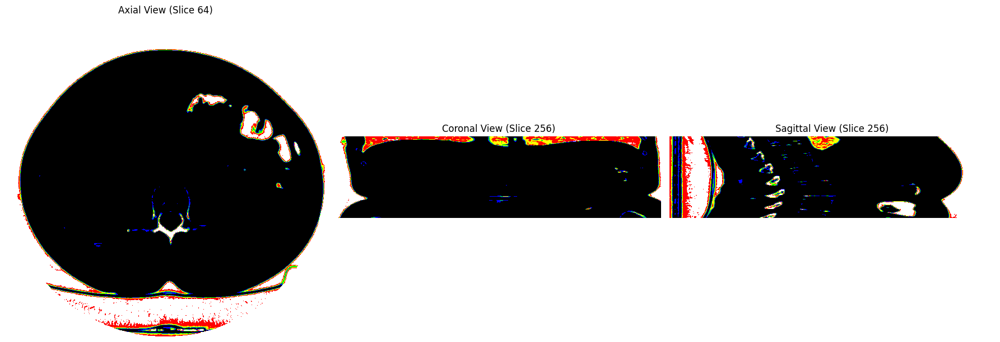

In [28]:
# Import necessary libraries
import nibabel as nib
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap

# Load the volume data
def load_nifti(file_path):
    nii_img = nib.load(file_path)
    nii_data = nii_img.get_fdata()
    return nii_data

# Generate a custom colormap
def create_custom_colormap():
    colors = [
        (0, 0, 0),        # Black for low intensity
        (0, 0, 1),        # Blue for low-mid intensity
        (0, 1, 0),        # Green for mid intensity
        (1, 1, 0),        # Yellow for high-mid intensity
        (1, 0, 0),        # Red for high intensity
        (1, 1, 1)         # White for the highest intensity
    ]
    return ListedColormap(colors)

# Plot 2D slices with custom coloring
def plot_custom_coloring(volume, mask=None, slice_indices=None):
    """
    Plots 2D slices of the volume with custom coloring.

    Parameters:
    - volume: 3D numpy array of volume data.
    - mask: 3D numpy array of the mask (optional, same shape as volume).
    - slice_indices: Dictionary specifying slice indices for each view.
    """
    if slice_indices is None:
        slice_indices = {
            "axial": volume.shape[2] // 2,  # Middle slice along axial axis
            "coronal": volume.shape[1] // 2,  # Middle slice along coronal axis
            "sagittal": volume.shape[0] // 2,  # Middle slice along sagittal axis
        }

    custom_cmap = create_custom_colormap()
    fig, axes = plt.subplots(1, 3, figsize=(18, 6))

    # Axial view
    axial_slice = volume[:, :, slice_indices["axial"]]
    if mask is not None:
        axial_slice = np.multiply(axial_slice, mask[:, :, slice_indices["axial"]])
    axes[0].imshow(axial_slice.T, cmap=custom_cmap, origin="lower")
    axes[0].set_title(f"Axial View (Slice {slice_indices['axial']})")
    axes[0].axis("off")

    # Coronal view
    coronal_slice = volume[:, slice_indices["coronal"], :]
    if mask is not None:
        coronal_slice = np.multiply(coronal_slice, mask[:, slice_indices["coronal"], :])
    axes[1].imshow(coronal_slice.T, cmap=custom_cmap, origin="lower")
    axes[1].set_title(f"Coronal View (Slice {slice_indices['coronal']})")
    axes[1].axis("off")

    # Sagittal view
    sagittal_slice = volume[slice_indices["sagittal"], :, :]
    if mask is not None:
        sagittal_slice = np.multiply(sagittal_slice, mask[slice_indices["sagittal"], :, :])
    axes[2].imshow(sagittal_slice.T, cmap=custom_cmap, origin="lower")
    axes[2].set_title(f"Sagittal View (Slice {slice_indices['sagittal']})")
    axes[2].axis("off")

    plt.tight_layout()
    plt.show()

# Load the volume and mask
volume_data = load_nifti(ori_path)
mask_data = load_nifti(mask_path)

# Plot the slices with custom coloring
plot_custom_coloring(volume_data, mask=mask_data)

In [31]:
import nibabel as nib
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
import ipywidgets as widgets
from ipywidgets import interact

# Load the volume data
def load_nifti(file_path):
    nii_img = nib.load(file_path)
    nii_data = nii_img.get_fdata()
    return nii_data

# Generate a custom colormap
def create_custom_colormap():
    colors = [
        (0, 0, 0),        # Black for low intensity
        (0, 0, 1),        # Blue for low-mid intensity
        (0, 1, 0),        # Green for mid intensity
        (1, 1, 0),        # Yellow for high-mid intensity
        (1, 0, 0),        # Red for high intensity
        (1, 1, 1)         # White for the highest intensity
    ]
    return ListedColormap(colors)

# Plot the selected slices
def plot_interactive_slices(axial_index, coronal_index, sagittal_index, colormap):
    """
    Displays 2D slices of the volume with the ability to adjust slice indices dynamically.

    Parameters:
    - axial_index, coronal_index, sagittal_index: Indices of the slices.
    - colormap: Colormap for visualization.
    """
    fig, axes = plt.subplots(1, 3, figsize=(18, 6))

    # Axial view
    axial_slice = volume_data[:, :, axial_index]
    if mask_data is not None:
        axial_slice = np.multiply(axial_slice, mask_data[:, :, axial_index])
    axes[0].imshow(axial_slice.T, cmap=colormap, origin="lower")
    axes[0].set_title(f"Axial View (Slice {axial_index})")
    axes[0].axis("off")

    # Coronal view
    coronal_slice = volume_data[:, coronal_index, :]
    if mask_data is not None:
        coronal_slice = np.multiply(coronal_slice, mask_data[:, coronal_index, :])
    axes[1].imshow(coronal_slice.T, cmap=colormap, origin="lower")
    axes[1].set_title(f"Coronal View (Slice {coronal_index})")
    axes[1].axis("off")

    # Sagittal view
    sagittal_slice = volume_data[sagittal_index, :, :]
    if mask_data is not None:
        sagittal_slice = np.multiply(sagittal_slice, mask_data[sagittal_index, :, :])
    axes[2].imshow(sagittal_slice.T, cmap=colormap, origin="lower")
    axes[2].set_title(f"Sagittal View (Slice {sagittal_index})")
    axes[2].axis("off")

    plt.tight_layout()
    plt.show()

volume_data = load_nifti(ori_path)
mask_data = load_nifti(mask_path)

# Create sliders and dropdown for interactive adjustment
axial_slider = widgets.IntSlider(value=volume_data.shape[2] // 2, min=0, max=volume_data.shape[2] - 1, step=1, description='Axial Slice')
coronal_slider = widgets.IntSlider(value=volume_data.shape[1] // 2, min=0, max=volume_data.shape[1] - 1, step=1, description='Coronal Slice')
sagittal_slider = widgets.IntSlider(value=volume_data.shape[0] // 2, min=0, max=volume_data.shape[0] - 1, step=1, description='Sagittal Slice')
colormap_dropdown = widgets.Dropdown(
    options=["viridis", "plasma", "cividis", "hot", "coolwarm", "gray"],
    value="viridis",
    description="Colormap"
)

# Use `interact` to link widgets with the plotting function
interact(plot_interactive_slices,
         axial_index=axial_slider,
         coronal_index=coronal_slider,
         sagittal_index=sagittal_slider,
         colormap=colormap_dropdown);

interactive(children=(IntSlider(value=64, description='Axial Slice', max=128), IntSlider(value=256, descriptio…